# Import Necessary Library

In [ ]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as mpatches
import sys
import warnings
import os
from tensorflow.keras import layers
import keras
import re
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('installing musescore...')
!apt install musescore3 > /dev/null

print('done!')

installing lilypond...
installing fluidsynth...
installing musescore...


done!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Gathering & Preprocessing

## Gather, Sampling and Key Transposing

In [ ]:
#Loading the list of chopin's midi files as stream
filepath = "/content/drive/MyDrive/ClassicalMusic/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi_ut = converter.parse(tr)
        midi = midi_ut.stripTies()
        all_midis.append(midi)


Gather all midis file and transpose the key of the all music to middle C

In [ ]:
all_midis = all_midis[:5]

Select 5 only chopin music.

## Music Functions

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(str(filename) + '.wav'))

define two functions to produce a music sheet and music audio

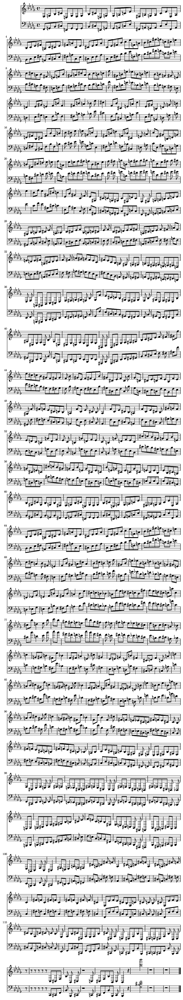

In [ ]:
show(all_midis[1])

In [ ]:
play(all_midis[1])

## Clef Splitting

In [ ]:
def split_part(midis):
  all_midis_parts = []

  for midi in midis:
    for i in range(len(midi.parts)):
      all_midis_parts.append(midi.parts[i])

  return all_midis_parts

split the midi file into parts

In [ ]:
all_midi_split = split_part(all_midis)

In [ ]:
len(all_midi_split)

11

Each of the music composed of two part which is also means two clef. There are total of 5 midi file, but there are 11 parts in total. One of the files may have more than one bass or treble clef.

In [ ]:
def split_clef(midis_parts):
  treble_clef_midi = []
  bass_clef_midi = []

  for midi in midis_parts:
    for element in midi.flat:

      clef_name = None

      if isinstance(element, music21.clef.Clef):
        clef_name = str(element.name)

        if clef_name  == 'treble':
          treble_clef_midi.append(midi)

        elif clef_name == 'bass':
          bass_clef_midi.append(midi)

  return treble_clef_midi, bass_clef_midi


In [ ]:
treble_midis, bass_midis = split_clef(all_midi_split)

Each of the part was looked for their clef property, the part with same clef property will be group together, i.e. part with treble clef property belongs to treble clef while part with bass clef property belongs to bass clef.  

In [ ]:
treble_midis

[<music21.stream.Part 0x7d41f87df550>,
 <music21.stream.Part 0x7d41ce004700>,
 <music21.stream.Part 0x7d41cca45270>,
 <music21.stream.Part 0x7d41cbafb610>,
 <music21.stream.Part 0x7d41c820dab0>]

In [ ]:
bass_midis

[<music21.stream.Part 0x7d41ce756ec0>,
 <music21.stream.Part 0x7d41cd44fee0>,
 <music21.stream.Part 0x7d41cca449d0>,
 <music21.stream.Part 0x7d41c9de7f70>,
 <music21.stream.Part 0x7d41c8003880>,
 <music21.stream.Part 0x7d41c8072560>]

## Duplicates

In [ ]:
duplicates = [element for element in bass_midis if element in treble_midis]
print(duplicates)

[]


No duplicates data

## Music Element Extraction

In [ ]:
def extract_notes_all(midi_clef):

  notes = []
  durations = []
  #types = []
  sequence_num = []

  for midi_part in midi_clef:
    for element in midi_part.flat:
      note_name = None
      duration_name  = None


    #if isinstance(element, music21.key.Key):
    # note_name = str(element.tonic.name) + ':' + str(element.mode)
    #  duration_name = "0.0"

    #elif isinstance(element, music21.meter.TimeSignature):
    #  note_name = str(element.ratioString) + 'TS'
    #  duration_name = "0.0"

      if isinstance(element, music21.chord.Chord):
        note_name = []
        duration_name = []
        for i in element.pitches:
          note_name.append(i.nameWithOctave)
        #note_name = element.pitches[-1].nameWithOctave
        #note_name = element
          #duration_name.append(element.duration.quarterLength)
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Rest):
        note_name = str(element.name)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Note):
        note_name = str(element.nameWithOctave)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      if note_name and duration_name:
        notes.append(note_name)
        durations.append(duration_name)

  return notes, durations

In [ ]:
bass_midis_element = extract_notes_all(bass_midis)
treble_midis_element = extract_notes_all(treble_midis)

The music element such as notes, chords and durations will be extracted for each clef. Noted that, each music elements of treble and bass clef are remains separated. The notes and chords are grouped together under the same feature while durations itself become another feature.

In [ ]:
bass_midis_element

(['F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'E-2',
  'A3',
  'C4',
  'B-3',
  'E-4',
  'F#3',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'rest',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C4',
  'E-3',
  'C#3',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'G#3',
  'F#3',
  'B3',
  'E-3',
  'F#3',
  'F3',
  'B-3',
  'C#3',
  'B-3',
  'B2',
  'B-3',
  'G#3',
  'rest',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3'

In [ ]:
len(bass_midis_element[0])

3963

In [ ]:
len(bass_midis_element[1])

3963

In [ ]:
treble_midis_element

([['C#4', 'F#4', 'B-4'],
  ['F#4', 'C#4', 'B-4'],
  ['C#4', 'B-4', 'F#4'],
  'rest',
  'F4',
  'B4',
  'G#4',
  ['F#4', 'B-4', 'C#4'],
  'rest',
  'C#4',
  ['F#4', 'B-4'],
  ['B-4', 'F#4'],
  'C#4',
  ['B-4', 'F#4'],
  'rest',
  ['B4', 'G#4'],
  ['B-4', 'F#4'],
  'rest',
  ['F4', 'G#4'],
  'rest',
  ['B-4', 'F#4'],
  'rest',
  'F4',
  ['C#5', 'B-4'],
  'rest',
  ['B4', 'G#4'],
  'rest',
  'rest',
  ['G#4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['B-4', 'C#4', 'C#5'],
  ['B-4', 'F#5', 'F#4'],
  'rest',
  ['C#5', 'F5', 'G#4'],
  ['F#4', 'G#4'],
  'F5',
  'E-5',
  ['F#4', 'G#4'],
  'rest',
  ['F4', 'C#5', 'G#4'],
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'B-3',
  ['F#4', 'B-4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['F#4', 'B-4'],
  'C#4',
  'rest',
  ['B4', 'F4'],
  'G#4',
  ['F#4', 'C#4', 'B-4'],
  'rest',
  ['C#4', 'B-4'],
  'F#4',
  'rest',
  [

In [ ]:
len(treble_midis_element[0])

4435

In [ ]:
len(treble_midis_element[1])

4435

## Dataframe Construction

In [ ]:
bass_df = pd.DataFrame(bass_midis_element).T
bass_df.columns = ['music_element', 'duration']
bass_df

,music_element,duration
0,F#2,0.5
1,F3,0.5
2,G#3,0.5
3,F#3,0.5
4,B-3,0.5
...,...,...
3958,E1,2.0
3959,E2,4.0
3960,rest,1.0
3961,B1,3.0


In [ ]:
treble_df = pd.DataFrame(treble_midis_element).T
treble_df.columns = ['music_element', 'duration']
treble_df

,music_element,duration
0,"[C#4, F#4, B-4]",3.0
1,"[F#4, C#4, B-4]",3.0
2,"[C#4, B-4, F#4]",3.0
3,rest,3.0
4,F4,3.0
...,...,...
4430,E4,0.25
4431,E4,1.0
4432,E4,0.75
4433,E4,0.25


There are total two dataframe constructed for each clef. Each dataframe consist of two features. The first feature named as 'music_element' where it consist of notes and chords while second feature named as 'duration' where it consist of duration only.

## Data Transformation

In [ ]:
chords_list_tr = []
for i in treble_df['music_element']:
  if type(i) == list:
    chords_list_tr.append(i)

In [ ]:
chords_list_tr

[['C#4', 'F#4', 'B-4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['F#4', 'B-4'],
 ['B-4', 'F#4'],
 ['B-4', 'F#4'],
 ['B4', 'G#4'],
 ['B-4', 'F#4'],
 ['F4', 'G#4'],
 ['B-4', 'F#4'],
 ['C#5', 'B-4'],
 ['B4', 'G#4'],
 ['G#4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['B-4', 'C#4', 'C#5'],
 ['B-4', 'F#5', 'F#4'],
 ['C#5', 'F5', 'G#4'],
 ['F#4', 'G#4'],
 ['F#4', 'G#4'],
 ['F4', 'C#5', 'G#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4'],
 ['B4', 'F4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4', 'C#4'],
 ['B-4', 'F#4', 'C#4'],
 ['F#4', 'B-4'],
 ['G#4', 'B4'],
 ['F#4', 'B-4'],
 ['G#4', 'F4'],
 ['B-4', 'F#4'],
 ['B-4', 'C#5'],
 ['G#4', 'B4'],
 ['C#4', 'G#4'],
 ['E4', 'C#4', 'B-4'],
 ['B-4', 'E4'],
 ['B-4', 'E4', 'C#5'],
 ['E4', 'E-5', 'B-4'],
 ['C#5', 'E4', 'B-4'],
 ['G#4', 'B4', 'E-4'],
 ['C#4', 'G4', 'B-4'],
 ['G#4', 'B3', 'B4'],
 ['G#4', 'B3'],
 ['B-4', 'C#4'],
 [

In [ ]:
chords_list_bs = []
for i in bass_df['music_element']:
  if type(i) == list:
    chords_list_bs.append(i)

In [ ]:
chords_list_bs

[['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'E-4'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'C#4'],
 ['E-3', 'C4'],
 ['E-3', 'B-3'],
 ['G#2', 'B-3'],
 ['G#2', 'G#3'],
 ['G#3', 'G#2'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['F#3', 'G#3'],
 ['F3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'C#4'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'B3'],
 ['C#3', 'B-3'],
 ['C#3', 'G#3'],
 ['F#2', 'G#3'],
 ['F#2', 'F#3'],
 ['F#3', 'F#2'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['E-3', 'F#3'],
 ['E-3', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#3', 'B2'],
 ['B2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['B2', 'F#3'],
 ['B2', 'F

In [ ]:
unique_chords_tr = list(np.unique(np.array(chords_list_tr, dtype = object)))

In [ ]:
chords_dict_tr = dict()
for i in range(len((unique_chords_tr))):
  if type(unique_chords_tr[i]) == list:
    chords_dict_tr[str('CH') + str(i)] =unique_chords_tr[i]

In [ ]:
chords_dict_tr

{'CH0': ['A4', 'E-4', 'C5'],
 'CH1': ['A4', 'E-4', 'E-5'],
 'CH2': ['A4', 'F5', 'E-4'],
 'CH3': ['A5', 'G#5'],
 'CH4': ['B-3', 'A4'],
 'CH5': ['B-3', 'B-4'],
 'CH6': ['B-3', 'C#4', 'B-4'],
 'CH7': ['B-3', 'D4', 'B-4'],
 'CH8': ['B-3', 'E-4', 'B-4'],
 'CH9': ['B-3', 'E4', 'B-4'],
 'CH10': ['B-3', 'F#4'],
 'CH11': ['B-3', 'F4', 'B-4'],
 'CH12': ['B-3', 'G4', 'B-4'],
 'CH13': ['B-4', 'B-3'],
 'CH14': ['B-4', 'B-3', 'C#4'],
 'CH15': ['B-4', 'B-5'],
 'CH16': ['B-4', 'B-5', 'G5'],
 'CH17': ['B-4', 'C#4'],
 'CH18': ['B-4', 'C#4', 'C#5'],
 'CH19': ['B-4', 'C#5'],
 'CH20': ['B-4', 'C#5', 'E4'],
 'CH21': ['B-4', 'E4'],
 'CH22': ['B-4', 'E4', 'C#5'],
 'CH23': ['B-4', 'F#4'],
 'CH24': ['B-4', 'F#4', 'C#4'],
 'CH25': ['B-4', 'F#5'],
 'CH26': ['B-4', 'F#5', 'F#4'],
 'CH27': ['B-4', 'G5'],
 'CH28': ['B-5', 'A5'],
 'CH29': ['B-5', 'B-4'],
 'CH30': ['B-5', 'C#5', 'G5'],
 'CH31': ['B-5', 'F#5'],
 'CH32': ['B-5', 'G5'],
 'CH33': ['B-5', 'G5', 'B-4'],
 'CH34': ['B-5', 'G5', 'C#5'],
 'CH35': ['B-6', 'B-5']

In [ ]:
unique_chords_bs = list(np.unique(np.array(chords_list_bs, dtype = object)))

In [ ]:
chords_dict_bs = dict()
for i in range(len((unique_chords_bs))):
  if type(unique_chords_bs[i]) == list:
    chords_dict_bs[str('CH') + str(i)] =unique_chords_bs[i]

In [ ]:
chords_dict_bs

{'CH0': ['A1', 'A2'],
 'CH1': ['A3', 'C#4'],
 'CH2': ['A3', 'C4', 'E3'],
 'CH3': ['A3', 'E-3'],
 'CH4': ['A4', 'C4', 'A3'],
 'CH5': ['A4', 'F#4', 'E-4', 'C4'],
 'CH6': ['B-1', 'B-2'],
 'CH7': ['B-1', 'B1'],
 'CH8': ['B-1', 'B1', 'C#2', 'B1', 'C#2'],
 'CH9': ['B-2', 'B-3'],
 'CH10': ['B-2', 'D3', 'G#3'],
 'CH11': ['B-2', 'E-3', 'G3'],
 'CH12': ['B-2', 'F#3'],
 'CH13': ['B-2', 'F3'],
 'CH14': ['B-2', 'F3', 'C#4'],
 'CH15': ['B-2', 'F3', 'G#3'],
 'CH16': ['B-2', 'G#3'],
 'CH17': ['B-2', 'G3'],
 'CH18': ['B-3', 'B-2'],
 'CH19': ['B-3', 'C#3'],
 'CH20': ['B-3', 'C#4'],
 'CH21': ['B-3', 'D4'],
 'CH22': ['B-3', 'E-4'],
 'CH23': ['B-3', 'F#3', 'C#3'],
 'CH24': ['B-3', 'F3', 'C#3', 'C#4'],
 'CH25': ['B-3', 'G3'],
 'CH26': ['B-3', 'G4', 'B-4'],
 'CH27': ['B-4', 'F#4', 'C#4'],
 'CH28': ['B-5', 'G5', 'B-4'],
 'CH29': ['B1', 'B2'],
 'CH30': ['B1', 'C#2', 'B1', 'C#2', 'B1'],
 'CH31': ['B2', 'F#3'],
 'CH32': ['B2', 'G#3'],
 'CH33': ['B3', 'D4', 'F#3'],
 'CH34': ['B3', 'E-4', 'F4', 'G#4'],
 'CH35': ['

In [ ]:
unique_duration_tr = list(np.unique(np.array(treble_df['duration'])))

In [ ]:
duration_dict_tr = dict()
for i in range(len((unique_duration_tr))):
    duration_dict_tr[str('DR') + str(i)] =unique_duration_tr[i]

In [ ]:
duration_dict_tr

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.4166666666666667,
 'DR5': 0.5,
 'DR6': 0.5833333333333334,
 'DR7': 0.6666666666666666,
 'DR8': 0.75,
 'DR9': 1.0,
 'DR10': 1.25,
 'DR11': 1.3333333333333333,
 'DR12': 1.5,
 'DR13': 2.0,
 'DR14': 2.25,
 'DR15': 2.5,
 'DR16': 2.6666666666666665,
 'DR17': 2.75,
 'DR18': 3.0,
 'DR19': 3.5,
 'DR20': 4.0,
 'DR21': 5.25,
 'DR22': 5.5,
 'DR23': 5.75,
 'DR24': 6.0}

In [ ]:
unique_duration_bs = list(np.unique(np.array(bass_df['duration'])))

In [ ]:
duration_dict_bs = dict()
for i in range(len((unique_duration_bs))):
    duration_dict_bs[str('DR') + str(i)] =unique_duration_bs[i]

In [ ]:
duration_dict_bs

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.5,
 'DR5': 0.5833333333333334,
 'DR6': 0.6666666666666666,
 'DR7': 0.75,
 'DR8': 1.0,
 'DR9': 1.25,
 'DR10': 1.5,
 'DR11': 1.6666666666666667,
 'DR12': 2.0,
 'DR13': 2.3333333333333335,
 'DR14': 2.5,
 'DR15': 2.6666666666666665,
 'DR16': 3.0,
 'DR17': 3.3333333333333335,
 'DR18': 4.0,
 'DR19': 6.0}

In [ ]:
for chord_str, chord_note_lst in chords_dict_tr.items():
  treble_df['music_element'] = treble_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

for chord_str, chord_note_lst in chords_dict_bs.items():
  bass_df['music_element'] = bass_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

In [ ]:
for duration_str, duration_lst in duration_dict_tr.items():
  treble_df['duration'] = treble_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_df['duration'] = bass_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

Transform both dataframe where list of chords were changed to chords label and numerical representation of duration data was transformed to categorical data.

## Feature Construction

In [ ]:
treble_df

,music_element,duration
0,CH46,DR18
1,CH97,DR18
2,CH44,DR18
3,rest,DR18
4,F4,DR18
...,...,...
4430,E4,DR2
4431,E4,DR9
4432,E4,DR8
4433,E4,DR2


In [ ]:
treble_df['note_duration'] = treble_df['music_element'].astype(str) +"_"+ treble_df['duration'].astype(str)

In [ ]:
treble_df

,music_element,duration,note_duration
0,CH46,DR18,CH46_DR18
1,CH97,DR18,CH97_DR18
2,CH44,DR18,CH44_DR18
3,rest,DR18,rest_DR18
4,F4,DR18,F4_DR18
...,...,...,...
4430,E4,DR2,E4_DR2
4431,E4,DR9,E4_DR9
4432,E4,DR8,E4_DR8
4433,E4,DR2,E4_DR2


In [ ]:
bass_df['note_duration'] = bass_df['music_element'].astype(str) +"_"+ bass_df['duration'].astype(str)

In [ ]:
bass_df

,music_element,duration,note_duration
0,F#2,DR4,F#2_DR4
1,F3,DR4,F3_DR4
2,G#3,DR4,G#3_DR4
3,F#3,DR4,F#3_DR4
4,B-3,DR4,B-3_DR4
...,...,...,...
3958,E1,DR12,E1_DR12
3959,E2,DR18,E2_DR18
3960,rest,DR8,rest_DR8
3961,B1,DR16,B1_DR16


construct a new features based on combination both features. The combined feature will be used for input data while the other features will be ignored.

## Label Encoding

In [ ]:
label_encoder_tr = preprocessing.LabelEncoder()

label_encoder_tr.fit_transform(treble_df['note_duration'])
treble_df['note_duration']= label_encoder_tr.transform(treble_df['note_duration'])

label_encoder_bs = preprocessing.LabelEncoder()

label_encoder_bs.fit_transform(bass_df['note_duration'])
bass_df['note_duration']= label_encoder_bs.transform(bass_df['note_duration'])

In [ ]:
treble_df

,music_element,duration,note_duration
0,CH46,DR18,215
1,CH97,DR18,283
2,CH44,DR18,211
3,rest,DR18,424
4,F4,DR18,361
...,...,...,...
4430,E4,DR2,323
4431,E4,DR9,328
4432,E4,DR8,327
4433,E4,DR2,323


In [ ]:
bass_df

,music_element,duration,note_duration
0,F#2,DR4,451
1,F3,DR4,472
2,G#3,DR4,491
3,F#3,DR4,457
4,B-3,DR4,29
...,...,...,...
3958,E1,DR12,431
3959,E2,DR18,434
3960,rest,DR8,523
3961,B1,DR16,36


Change the combined feature of dataframe from categorical data to numerical data by using label encoding.

## Specify Vocab Size for Combined Feature

In [ ]:
vocab_size_tr = len(np.unique(treble_df['note_duration']))

In [ ]:
vocab_size_tr

434

In [ ]:
vocab_size_bs = len(np.unique(bass_df['note_duration']))

In [ ]:
vocab_size_bs

525

## Training Data Construction

In [ ]:
train_tr = []
label_tr = []
note_duration_tr = list(treble_df['note_duration'])
sequence_length = 100


for i in range(len(treble_df) - sequence_length):
      in_1 = note_duration_tr[i:i+sequence_length]
      out_1 = note_duration_tr[i+1:i+1+sequence_length]
      train_tr.append(in_1)
      label_tr.append(out_1)


In [ ]:
train_bs = []
label_bs = []
note_duration_bs = list(bass_df['note_duration'])
sequence_length = 100


for i in range(len(bass_df) - sequence_length):
      in_1 = note_duration_bs[i:i+sequence_length]
      out_1 = note_duration_bs[i+1:i+1+sequence_length]
      train_bs.append(in_1)
      label_bs.append(out_1)


In [ ]:
train_tr = np.array(train_tr, float)
label_tr = np.array(label_tr, float)

In [ ]:
train_df_tr = (train_tr, label_tr)

In [ ]:
train_df_tr

(array([[215., 283., 211., ..., 227., 138., 219.],
        [283., 211., 424., ..., 138., 219., 134.],
        [211., 424., 361., ..., 219., 134., 304.],
        ...,
        [319., 425., 415., ..., 308., 323., 328.],
        [425., 415., 401., ..., 323., 328., 327.],
        [415., 401.,  15., ..., 328., 327., 323.]]),
 array([[283., 211., 424., ..., 138., 219., 134.],
        [211., 424., 361., ..., 219., 134., 304.],
        [424., 361.,  48., ..., 134., 304., 132.],
        ...,
        [425., 415., 401., ..., 323., 328., 327.],
        [415., 401.,  15., ..., 328., 327., 323.],
        [401.,  15.,  38., ..., 327., 323., 322.]]))

In [ ]:
train_bs = np.array(train_bs, float)
label_bs = np.array(label_bs, float)

In [ ]:
train_df_bs = (train_bs, label_bs)

In [ ]:
train_df_bs

(array([[451., 472., 491., ..., 517., 451., 472.],
        [472., 491., 457., ..., 451., 472., 491.],
        [491., 457.,  29., ..., 472., 491., 457.],
        ...,
        [ 73., 177., 211., ..., 302., 431., 434.],
        [177., 211.,  73., ..., 431., 434., 523.],
        [211.,  73., 211., ..., 434., 523.,  36.]]),
 array([[472., 491., 457., ..., 451., 472., 491.],
        [491., 457.,  29., ..., 472., 491., 457.],
        [457.,  29.,  58., ..., 491., 457.,  29.],
        ...,
        [177., 211.,  73., ..., 431., 434., 523.],
        [211.,  73., 211., ..., 434., 523.,  36.],
        [ 73., 211., 213., ..., 523.,  36., 431.]]))

constructing arrays based on the input sequence and output sequence for 100 sequence length each using the combined feature only.

# Modelling - GPT

### Embedding Layer and Positional Encoding

In [ ]:
class TokenAndPositionEmbedding(layers.Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)
#         self.pos_emb = layers.Embedding(input_dim=maxlen, output_dim=embed_dim)
        self.vocab_size = vocab_size
        self.embed_dim = embed_dim
        self.maxlen = maxlen
        self.maximum_position_encoding = 10000

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'vocab_size': self.vocab_size,
            'embed_dim': self.embed_dim,
            'maxlen': self.maxlen,
        })
        return config

    def get_angles(self, pos, i, d_model):
        angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
        return pos * angle_rates

    def positional_encoding(self, position, d_model):
        angle_rads = self.get_angles(np.arange(position)[:, np.newaxis],
                              np.arange(d_model)[np.newaxis, :],
                              d_model)
        # apply sin to even indices in the array; 2i
        angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
        # apply cos to odd indices in the array; 2i+1
        angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
        pos_encoding = angle_rads[np.newaxis, ...]
        return tf.cast(pos_encoding, dtype=tf.float32)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        pos_encoding = self.positional_encoding(self.maximum_position_encoding, self.embed_dim)
        x = self.token_emb(x)
        return x + pos_encoding[:,:maxlen,:]

### Mult Head Self Attention

In [ ]:
class MultiHeadSelfAttention(layers.Layer):
    def __init__(self, embed_dim, num_heads=8):
        #defining no of nodes/dim for each layer
        super(MultiHeadSelfAttention, self).__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        if embed_dim % num_heads != 0:
            raise ValueError(
                f"embedding dimension = {embed_dim} should be divisible by number of heads = {num_heads}"
            )
        self.projection_dim = embed_dim // num_heads
        self.query_dense = layers.Dense(embed_dim)
        self.key_dense = layers.Dense(embed_dim)
        self.value_dense = layers.Dense(embed_dim)
        self.combine_heads = layers.Dense(embed_dim)

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'embed_dim': self.embed_dim,
            'num_heads': self.num_heads,
        })
        return config

    @staticmethod
    def causal_attention_mask(n_dest, n_src, dtype):
        """
        1's in the lower triangle, counting from the lower right corner.
        """
        i = tf.range(n_dest)[:, None]
        j = tf.range(n_src)
        m = i >= j - n_src + n_dest
        return tf.cast(m, dtype)

    def attention(self, query, key, value):
        score = tf.matmul(query, key, transpose_b=True)
        dim_key = tf.cast(tf.shape(key)[-1], tf.float32)
        scaled_score = score / tf.math.sqrt(dim_key)

        # prevent information flow from future tokens
        shape = tf.shape(scaled_score)
        dim_dest, dim_src = shape[2], shape[3]
        attention_mask = self.causal_attention_mask(
            dim_dest, dim_src, scaled_score.dtype
        )
        attention_mask = tf.reshape(attention_mask, [1, 1, dim_dest, dim_src])
        scaled_score = scaled_score * attention_mask - 1e4 * (1 - attention_mask)

        weights = tf.nn.softmax(scaled_score, axis=-1)
        output = tf.matmul(weights, value)
        return output, weights

    def separate_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.projection_dim))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, inputs):
        # x.shape = [batch_size, seq_len, embedding_dim]
        batch_size = tf.shape(inputs)[0]
        query = self.query_dense(inputs)  # (batch_size, seq_len, embed_dim)
        key = self.key_dense(inputs)  # (batch_size, seq_len, embed_dim)
        value = self.value_dense(inputs)  # (batch_size, seq_len, embed_dim)
        query = self.separate_heads(query, batch_size)  # (batch_size, num_heads, seq_len, projection_dim)
        key = self.separate_heads(key, batch_size)  # (batch_size, num_heads, seq_len, projection_dim)
        value = self.separate_heads(value, batch_size)  # (batch_size, num_heads, seq_len, projection_dim)
        attention, weights = self.attention(query, key, value)
        attention = tf.transpose(attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len, num_heads, projection_dim)
        concat_attention = tf.reshape(attention, (batch_size, -1, self.embed_dim))  # (batch_size, seq_len, embed_dim)
        output = self.combine_heads(concat_attention)  # (batch_size, seq_len, embed_dim)
        return output

### Transformer Block

In [ ]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, dropout_rate=0.1):
        super(TransformerBlock, self).__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.dropout_rate = dropout_rate

        self.att = MultiHeadSelfAttention(embed_dim, num_heads)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(dropout_rate)
        self.dropout2 = layers.Dropout(dropout_rate)

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'embed_dim': self.embed_dim,
            'num_heads': self.num_heads,
            'ff_dim': self.ff_dim,
            'dropout_rate': self.dropout_rate,
        })
        return config

    def call(self, inputs):
        attention_output = self.att(inputs)
        attention_output = self.dropout1(attention_output)
        out1 = self.layernorm1(inputs + attention_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output)
        return self.layernorm2(out1 + ffn_output)

## Model Architecture

In [ ]:
def create_model(vocab_size):
    inputs = layers.Input(shape=(maxlen,), dtype=tf.int32)
    embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
    x = embedding_layer(inputs)
    transformer_block1 = TransformerBlock(embed_dim, num_heads, feed_forward_dim, dropout_rate = 0.25)
    transformer_block2 = TransformerBlock(embed_dim, num_heads, feed_forward_dim, dropout_rate = 0.25)
    transformer_block3 = TransformerBlock(embed_dim, num_heads, feed_forward_dim, dropout_rate = 0.25)
    x = transformer_block1(x)
    x = transformer_block2(x)
    x = transformer_block3(x)
    outputs = layers.Dense(vocab_size)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    #opt = keras.optimizers.Adam(learning_rate=0.001)
    model.compile(
        "adam", loss=[loss_fn],
    )  # No loss and optimization based on word embeddings from transformer block
    return model

In [ ]:
maxlen = sequence_length
batch_size = 32
embed_dim = 128
num_heads = 4
feed_forward_dim = 128
epochs = 50

Specify the important variables

## Model Training - Treble

In [ ]:
lm_tr = create_model(vocab_size_tr)
lm_tr.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 token_and_position_embeddi  (None, 100, 128)          55552     
 ng (TokenAndPositionEmbedd                                      
 ing)                                                            
                                                                 
 transformer_block (Transfo  (None, 100, 128)          99584     
 rmerBlock)                                                      
                                                                 
 transformer_block_1 (Trans  (None, 100, 128)          99584     
 formerBlock)                                                    
                                                                 
 transformer_block_2 (Trans  (None, 100, 128)          99584 

Epoch 1/50
136/136 [==============================] - 54s 332ms/step - loss: 4.9368
Epoch 2/50
136/136 [==============================] - 44s 326ms/step - loss: 3.5084
Epoch 3/50
136/136 [==============================] - 44s 323ms/step - loss: 1.6301
Epoch 4/50
136/136 [==============================] - 44s 321ms/step - loss: 0.8791
Epoch 5/50
136/136 [==============================] - 43s 320ms/step - loss: 0.5338
Epoch 6/50
136/136 [==============================] - 44s 320ms/step - loss: 0.3512
Epoch 7/50
136/136 [==============================] - 44s 325ms/step - loss: 0.2540
Epoch 8/50
136/136 [==============================] - 44s 325ms/step - loss: 0.2034
Epoch 9/50
136/136 [==============================] - 44s 325ms/step - loss: 0.1702
Epoch 10/50
136/136 [==============================] - 44s 321ms/step - loss: 0.1486
Epoch 11/50
136/136 [==============================] - 44s 323ms/step - loss: 0.1347
Epoch 12/50
136/136 [==============================] - 45s 327ms/step - lo

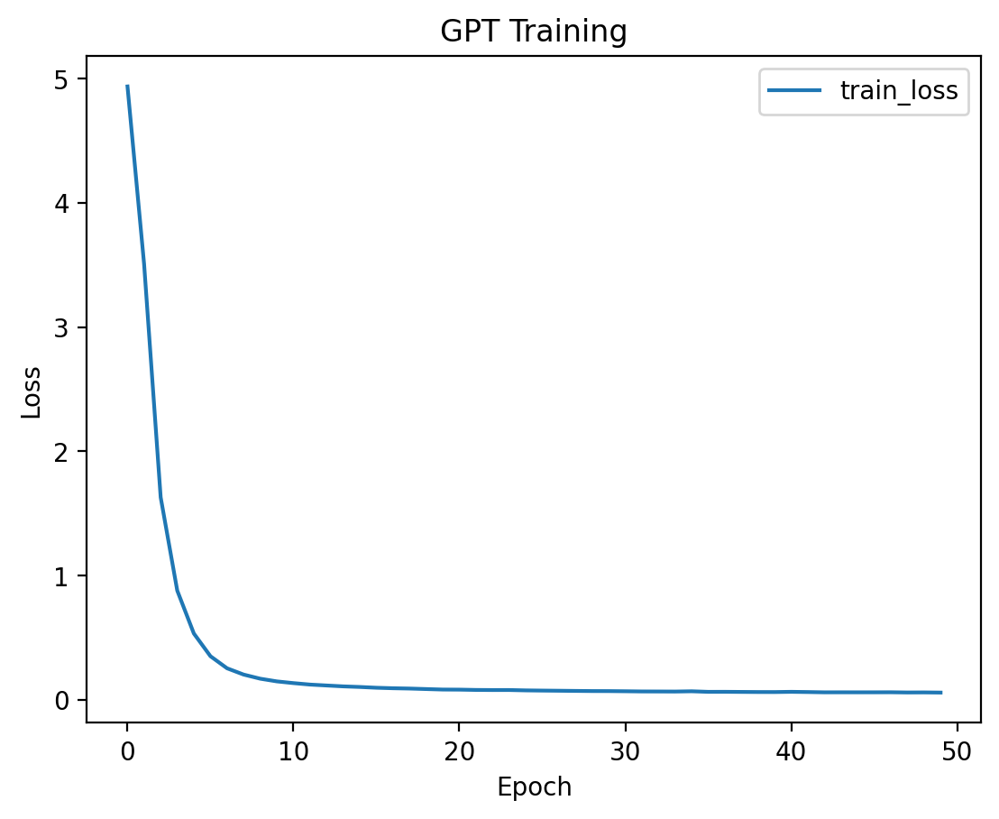

In [ ]:
history = lm_tr.fit(x = train_df_tr[0], y = train_df_tr[1],
                   epochs = epochs,
                   verbose = 1)

train_loss = history.history['loss']

plt.plot(train_loss)
plt.title('GPT Training')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss'], loc='upper right')
plt.show()

## Music Element Prediction - Treble

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(treble_df['note_duration'])-sequence_length)
start_tokens = treble_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_tr = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_tr.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_tr.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_tr)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 1s 1s/step
generated 1 notes
1/1 [==============================] - 0s 31ms/step
generated 2 notes
1/1 [==============================] - 0s 27ms/step
generated 3 notes
1/1 [==============================] - 0s 30ms/step
generated 4 notes
1/1 [==============================] - 0s 28ms/step
generated 5 notes
1/1 [==============================] - 0s 26ms/step
generated 6 notes
1/1 [==============================] - 0s 29ms/step
generated 7 notes
1/1 [==============================] - 0s 34ms/step
generated 8 notes
1/1 [==============================] - 0s 27ms/step
generated 9 notes
1/1 [==============================] - 0s 29ms/step
generated 10 notes
1/1 [==============================] - 0s 26ms/step
generated 11 notes
1/1 [==============================] - 0s 27ms/step
generated 12 notes
1/1 [==============================] - 0s 27ms/step
generated 13 notes
1/1 [==============================] - 0s 27ms/step
generated 14 notes
1/1 [============

Predict and generate 100 music element

## Inverse Label Encoding - Treble

In [ ]:
iv_togen_tr = label_encoder_tr.inverse_transform(tokens_generated_tr)

## Feature Splitting - Treble

In [ ]:
pred_note_tr = []
pred_dur_tr = []

for i in iv_togen_tr:
  pred_note_tr.append(re.split('_', i)[0])
  pred_dur_tr.append(re.split('_', i)[1])


In [ ]:
pred_note_tr

['CH15',
 'rest',
 'CH15',
 'rest',
 'CH15',
 'rest',
 'CH15',
 'rest',
 'CH15',
 'rest',
 'CH11',
 'rest',
 'CH5',
 'rest',
 'CH9',
 'rest',
 'CH8',
 'rest',
 'CH5',
 'rest',
 'CH7',
 'rest',
 'CH5',
 'rest',
 'CH5',
 'rest',
 'CH5',
 'CH5',
 'rest',
 'CH5',
 'rest',
 'CH5',
 'CH5',
 'rest',
 'CH5',
 'rest',
 'CH5',
 'rest',
 'D5',
 'E-5',
 'CH70',
 'rest',
 'B-4',
 'rest',
 'E-5',
 'F5',
 'CH85',
 'rest',
 'B-4',
 'rest',
 'F5',
 'G5',
 'CH114',
 'rest',
 'CH34',
 'CH34',
 'CH34',
 'B-5',
 'CH58',
 'C6',
 'B-5',
 'CH66',
 'rest',
 'rest',
 'G#5',
 'B4',
 'B-5',
 'G#5',
 'CH27',
 'rest',
 'rest',
 'G5',
 'B-4',
 'G#5',
 'G5',
 'CH127',
 'rest',
 'rest',
 'F5',
 'G#4',
 'G5',
 'F5',
 'CH84',
 'rest',
 'rest',
 'CH29',
 'D5',
 'E-5',
 'CH70',
 'rest',
 'CH29',
 'E-5',
 'F5',
 'CH85',
 'rest',
 'CH29',
 'F5',
 'G5',
 'CH114',
 'rest',
 'CH34']

In [ ]:
pred_dur_tr

['DR2',
 'DR2',
 'DR5',
 'DR5',
 'DR2',
 'DR2',
 'DR2',
 'DR2',
 'DR5',
 'DR12',
 'DR2',
 'DR2',
 'DR2',
 'DR2',
 'DR5',
 'DR12',
 'DR2',
 'DR2',
 'DR2',
 'DR2',
 'DR5',
 'DR5',
 'DR2',
 'DR2',
 'DR2',
 'DR2',
 'DR9',
 'DR2',
 'DR2',
 'DR2',
 'DR2',
 'DR9',
 'DR2',
 'DR2',
 'DR2',
 'DR2',
 'DR5',
 'DR5',
 'DR5',
 'DR5',
 'DR8',
 'DR2',
 'DR5',
 'DR5',
 'DR5',
 'DR5',
 'DR8',
 'DR2',
 'DR5',
 'DR5',
 'DR5',
 'DR5',
 'DR8',
 'DR2',
 'DR13',
 'DR5',
 'DR5',
 'DR9',
 'DR13',
 'DR5',
 'DR5',
 'DR5',
 'DR9',
 'DR5',
 'DR9',
 'DR13',
 'DR5',
 'DR5',
 'DR5',
 'DR9',
 'DR5',
 'DR9',
 'DR13',
 'DR5',
 'DR5',
 'DR5',
 'DR9',
 'DR5',
 'DR9',
 'DR13',
 'DR5',
 'DR5',
 'DR5',
 'DR9',
 'DR5',
 'DR9',
 'DR5',
 'DR5',
 'DR8',
 'DR2',
 'DR9',
 'DR5',
 'DR5',
 'DR8',
 'DR2',
 'DR9',
 'DR5',
 'DR5',
 'DR8',
 'DR2',
 'DR12']

Split the music element (combined feature) into two features which are notes and durations

## Dataframe Construction - Treble

In [ ]:
generated_tr_lm = pd.DataFrame(list(zip(pred_note_tr, pred_dur_tr)), columns =['music_element', 'duration'])

In [ ]:
generated_tr_lm

,music_element,duration
0,CH15,DR2
1,rest,DR2
2,CH15,DR5
3,rest,DR5
4,CH15,DR2
...,...,...
96,F5,DR5
97,G5,DR5
98,CH114,DR8
99,rest,DR2


## Inverse Transformation - Treble

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_lm['music_element'] = generated_tr_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_lm['duration'] = generated_tr_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_tr_lm

,music_element,duration
0,"[B-4, B-5]",0.25
1,rest,0.25
2,"[B-4, B-5]",0.50
3,rest,0.50
4,"[B-4, B-5]",0.25
...,...,...
96,F5,0.50
97,G5,0.50
98,"[F5, G#5]",0.75
99,rest,0.25


## Model Training - Bass

In [ ]:
lm_bs = create_model(vocab_size_bs)
lm_bs.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 token_and_position_embeddi  (None, 100, 128)          67200     
 ng_1 (TokenAndPositionEmbe                                      
 dding)                                                          
                                                                 
 transformer_block_3 (Trans  (None, 100, 128)          99584     
 formerBlock)                                                    
                                                                 
 transformer_block_4 (Trans  (None, 100, 128)          99584     
 formerBlock)                                                    
                                                                 
 transformer_block_5 (Trans  (None, 100, 128)          9958

Epoch 1/50
121/121 [==============================] - 51s 349ms/step - loss: 4.9081
Epoch 2/50
121/121 [==============================] - 41s 337ms/step - loss: 3.8106
Epoch 3/50
121/121 [==============================] - 41s 336ms/step - loss: 2.1412
Epoch 4/50
121/121 [==============================] - 42s 347ms/step - loss: 1.1710
Epoch 5/50
121/121 [==============================] - 42s 346ms/step - loss: 0.6902
Epoch 6/50
121/121 [==============================] - 42s 346ms/step - loss: 0.4421
Epoch 7/50
121/121 [==============================] - 42s 346ms/step - loss: 0.3141
Epoch 8/50
121/121 [==============================] - 42s 347ms/step - loss: 0.2435
Epoch 9/50
121/121 [==============================] - 40s 335ms/step - loss: 0.1987
Epoch 10/50
121/121 [==============================] - 41s 337ms/step - loss: 0.1689
Epoch 11/50
121/121 [==============================] - 41s 343ms/step - loss: 0.1497
Epoch 12/50
121/121 [==============================] - 41s 343ms/step - lo

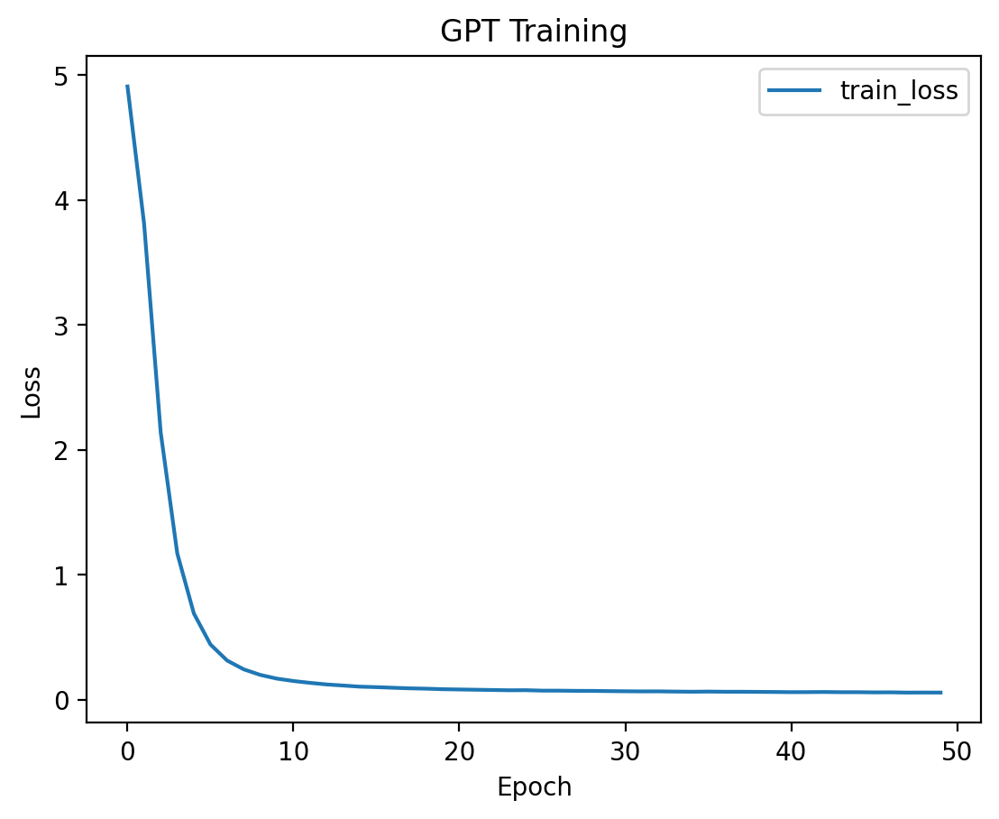

In [ ]:
history = lm_bs.fit(x = train_df_bs[0], y = train_df_bs[1],
                   epochs = epochs,
                   verbose = 1)

train_loss = history.history['loss']

plt.plot(train_loss)
plt.title('GPT Training')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss'], loc='upper right')
plt.show()

## Music Element Prediction - Bass

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(bass_df['note_duration'])-sequence_length)
start_tokens = bass_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_bs = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_bs.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_bs.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_bs)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 1s 1s/step
generated 1 notes
1/1 [==============================] - 0s 27ms/step
generated 2 notes
1/1 [==============================] - 0s 26ms/step
generated 3 notes
1/1 [==============================] - 0s 25ms/step
generated 4 notes
1/1 [==============================] - 0s 27ms/step
generated 5 notes
1/1 [==============================] - 0s 31ms/step
generated 6 notes
1/1 [==============================] - 0s 29ms/step
generated 7 notes
1/1 [==============================] - 0s 25ms/step
generated 8 notes
1/1 [==============================] - 0s 25ms/step
generated 9 notes
1/1 [==============================] - 0s 24ms/step
generated 10 notes
1/1 [==============================] - 0s 24ms/step
generated 11 notes
1/1 [==============================] - 0s 25ms/step
generated 12 notes
1/1 [==============================] - 0s 28ms/step
generated 13 notes
1/1 [==============================] - 0s 28ms/step
generated 14 notes
1/1 [============

Predict and generate 100 music element

## Inverse Label Encoding - Bass

In [ ]:
iv_togen_bs = label_encoder_bs.inverse_transform(tokens_generated_bs)

In [ ]:
iv_togen_bs

array(['F#3_DR4', 'E-3_DR4', 'B-3_DR3', 'G#3_DR4', 'C#3_DR4', 'E-3_DR4',
       'F3_DR4', 'C#3_DR4', 'B-3_DR3', 'G#3_DR4', 'C3_DR4', 'C#3_DR4',
       'E-3_DR4', 'C3_DR4', 'F3_DR3', 'E-3_DR4', 'B-2_DR4', 'F3_DR4',
       'E-3_DR4', 'G#2_DR4', 'F3_DR3', 'F#3_DR4', 'F3_DR4', 'E-3_DR4',
       'C#3_DR4', 'C3_DR4', 'B-2_DR3', 'A2_DR6', 'F3_DR4', 'C3_DR4',
       'E-3_DR4', 'C#3_DR4', 'B-2_DR3', 'A2_DR6', 'F3_DR4', 'C3_DR4',
       'E-3_DR4', 'C#3_DR4', 'B-2_DR3', 'A2_DR6', 'F3_DR4', 'C3_DR4',
       'E-3_DR4', 'C#3_DR4', 'B-2_DR3', 'G#3_DR4', 'G3_DR4', 'F3_DR4',
       'E-3_DR4', 'D3_DR4', 'C3_DR3', 'B2_DR6', 'G3_DR4', 'D3_DR4',
       'F3_DR4', 'E-3_DR4', 'C3_DR3', 'B2_DR6', 'G3_DR4', 'D3_DR4',
       'F3_DR4', 'E-3_DR4', 'C3_DR3', 'B2_DR6', 'G3_DR4', 'D3_DR4',
       'F3_DR4', 'E-3_DR4', 'C3_DR3', 'C#4_DR4', 'C4_DR4', 'B-3_DR4',
       'G#3_DR4', 'G3_DR4', 'F3_DR3', 'B-3_DR4', 'E3_DR4', 'G3_DR4',
       'C#3_DR4', 'E3_DR4', 'C3_DR3', 'C#4_DR4', 'C4_DR4', 'B-3_DR4',
       'G#3_DR4', 'G3_

## Feature Splitting - Bass

In [ ]:
pred_note_bs = []
pred_dur_bs = []

for i in iv_togen_bs:
  pred_note_bs.append(re.split('_', i)[0])
  pred_dur_bs.append(re.split('_', i)[1])


In [ ]:
pred_note_bs

['F#3',
 'E-3',
 'B-3',
 'G#3',
 'C#3',
 'E-3',
 'F3',
 'C#3',
 'B-3',
 'G#3',
 'C3',
 'C#3',
 'E-3',
 'C3',
 'F3',
 'E-3',
 'B-2',
 'F3',
 'E-3',
 'G#2',
 'F3',
 'F#3',
 'F3',
 'E-3',
 'C#3',
 'C3',
 'B-2',
 'A2',
 'F3',
 'C3',
 'E-3',
 'C#3',
 'B-2',
 'A2',
 'F3',
 'C3',
 'E-3',
 'C#3',
 'B-2',
 'A2',
 'F3',
 'C3',
 'E-3',
 'C#3',
 'B-2',
 'G#3',
 'G3',
 'F3',
 'E-3',
 'D3',
 'C3',
 'B2',
 'G3',
 'D3',
 'F3',
 'E-3',
 'C3',
 'B2',
 'G3',
 'D3',
 'F3',
 'E-3',
 'C3',
 'B2',
 'G3',
 'D3',
 'F3',
 'E-3',
 'C3',
 'C#4',
 'C4',
 'B-3',
 'G#3',
 'G3',
 'F3',
 'B-3',
 'E3',
 'G3',
 'C#3',
 'E3',
 'C3',
 'C#4',
 'C4',
 'B-3',
 'G#3',
 'G3',
 'F3',
 'B-3',
 'E3',
 'G3',
 'C#3',
 'E3',
 'C3',
 'B-3',
 'E3',
 'G3',
 'C#3',
 'E3',
 'C3',
 'G3',
 'C#3']

In [ ]:
pred_dur_bs

['DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR6',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR6',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR6',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR6',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR6',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR6',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR4',
 'DR3',
 'DR4',
 'DR4']

Split the music element (combined feature) into two features which are notes and durations

## Dataframe Construction - Bass

In [ ]:
generated_bs_lm = pd.DataFrame(list(zip(pred_note_bs, pred_dur_bs)), columns =['music_element', 'duration'])

In [ ]:
generated_bs_lm

,music_element,duration
0,F#3,DR4
1,E-3,DR4
2,B-3,DR3
3,G#3,DR4
4,C#3,DR4
...,...,...
96,C#3,DR4
97,E3,DR4
98,C3,DR3
99,G3,DR4


## Inverse Transformation - Bass

In [ ]:
for element_str, element_lst in chords_dict_bs.items():
  generated_bs_lm['music_element'] = generated_bs_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  generated_bs_lm['duration'] = generated_bs_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_bs_lm

,music_element,duration
0,F#3,0.500000
1,E-3,0.500000
2,B-3,0.333333
3,G#3,0.500000
4,C#3,0.500000
...,...,...
96,C#3,0.500000
97,E3,0.500000
98,C3,0.333333
99,G3,0.500000


# Music Generation

## Music Score and Stream Initialization

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=60)
keys = key.Key(pitch.Pitch('C'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

## Music Stream Construction

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

Function above add and submit the generated treble and bass clef data into music stream.

In [ ]:
treble_generation_part_lm = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_lm)

In [ ]:
bass_generation_part_lm = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, generated_bs_lm)

## Music Streams Balancing

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_lm[-1].offset):
    bass_generation_part_lm.remove(i)

for i in treble_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_lm[-1].offset):
    treble_generation_part_lm.remove(i)

Balancing both treble clef and bass clef generated data to make sure the length of both clef is the same. Noted that, eventhought both have similar sequence, the duration of the notes play importance role in stream length. Where longer duration causes stream length to be longer and vice versa.

## Music Score Construction

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

Add the music stream of treble clef and bass clef to music score.

# Music Generated

In [ ]:
music_generated_lm = music_generation_main(main_stream, [treble_generation_part_lm, bass_generation_part_lm])

In [ ]:
music_generated_lm.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark larghetto Quarter=60>
    {0.0} <music21.key.Key of C major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.chord.Chord B-4 B-5>
    {0.25} <music21.note.Rest 16th>
    {0.5} <music21.chord.Chord B-4 B-5>
    {1.0} <music21.note.Rest eighth>
    {1.5} <music21.chord.Chord B-4 B-5>
    {1.75} <music21.note.Rest 16th>
    {2.0} <music21.chord.Chord B-4 B-5>
    {2.25} <music21.note.Rest 16th>
    {2.5} <music21.chord.Chord B-4 B-5>
    {3.0} <music21.note.Rest dotted-quarter>
    {4.5} <music21.chord.Chord B-3 F4 B-4>
    {4.75} <music21.note.Rest 16th>
    {5.0} <music21.chord.Chord B-3 B-4>
    {5.25} <music21.note.Rest 16th>
    {5.5} <music21.chord.Chord B-3 E4 B-4>
    {6.0} <music21.note.Rest dotted-quarter>
    {7.5} <music21.chord.Chord B-3 E-4 B-4>
    {7.75} <music21.note.Rest 16th>
    {8.0} <music21.chord.Cho

## Music Sheet

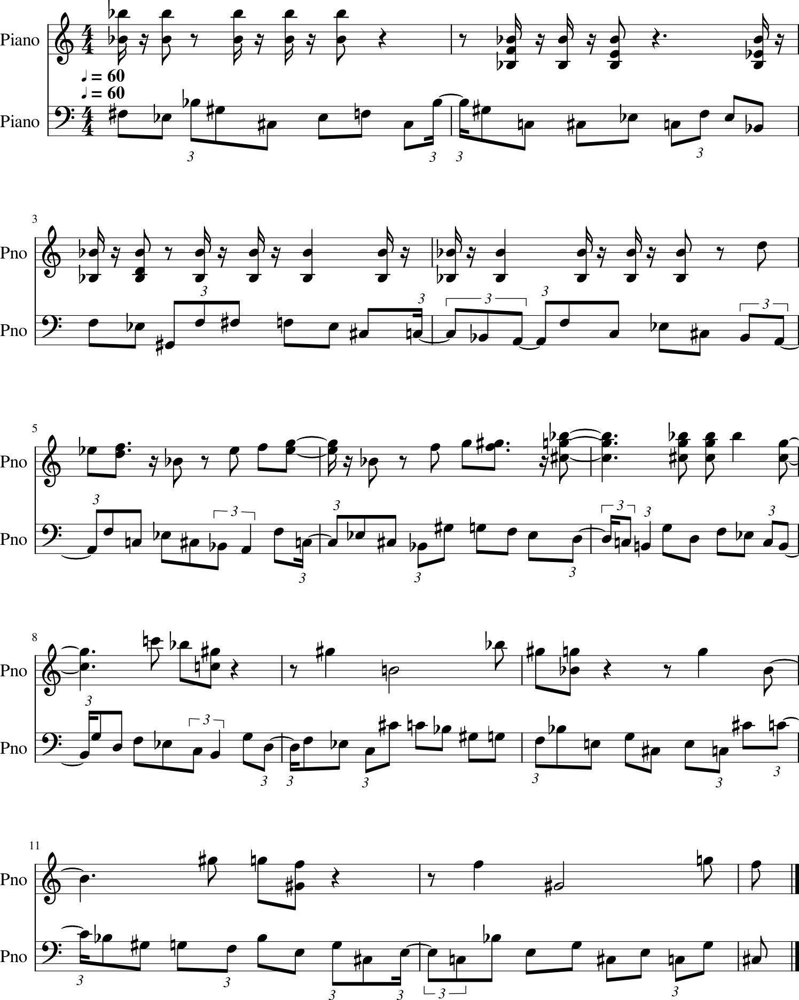

In [ ]:
music_generated_lm.show()

## Music Audio

In [ ]:
play(music_generated_lm)

# Save Model

In [ ]:
lm_tr.save("/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenGPT_tr")

In [ ]:
lm_bs.save("/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenGPT_bs")